# Klasifikasi Tingkat Kerusakan Jalan dengan CNN (MobileNetV2)

**Studi Kasus:** Sistem Informasi Geografis Pemetaan Kerusakan Jalan di Kota Lhokseumawe

Notebook ini disusun per cell agar mudah dijalankan bertahap di Google Colab.

Alur besar notebook:
1. Persiapan library
2. Mount Google Drive dan load data
3. Labeling otomatis via klasterisasi fitur citra (K-Means)
4. Preprocessing citra
5. Split data (Stratified K-Fold)
6. Augmentasi
7. Training model (2 fase)
8. Evaluasi model
9. Klasifikasi seluruh data dan ekspor GeoJSON untuk GIS

**Catatan revisi:** Cell 3 versi ini melabel foto secara otomatis dengan klasterisasi
tak terawasi (K-Means) atas fitur visual citra, tanpa memakai kolom P dan L dari Excel
sama sekali. Ini menggantikan proxy P x L dan deteksi piksel manual sebelumnya, yang
keduanya terbukti tidak akurat dan tidak mencerminkan kondisi jalan yang sebenarnya.

In [3]:
# ============================================================
# CELL 1 - PERSIAPAN LIBRARY
# ============================================================

# Install library tambahan yang belum tersedia default di Colab.
# opencv-python-headless dipakai agar tidak konflik dengan GUI backend.
!pip install -q opencv-python-headless openpyxl scikit-learn tqdm

# --- Library dasar ---
import os
import sys
import json
import random
import shutil
import warnings
import zipfile
from pathlib import Path

# --- Library komputasi dan data ---
import numpy as np
import pandas as pd

# --- Library visualisasi ---
import matplotlib.pyplot as plt
import seaborn as sns

# --- Library pengolahan citra ---
import cv2
from PIL import Image

# --- Library deep learning ---
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# --- Library evaluasi dan split data ---
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score,
    precision_recall_fscore_support,
)
from sklearn.utils.class_weight import compute_class_weight

# --- Progress bar ---
from tqdm.notebook import tqdm

# --- Utilitas khusus Google Colab (drive, upload file) ---
from google.colab import drive, files

# --- Konfigurasi umum ---
warnings.filterwarnings('ignore')
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# --- Cek versi library utama ---
print('Python       :', sys.version.split()[0])
print('TensorFlow   :', tf.__version__)
print('Keras        :', keras.__version__)
print('OpenCV       :', cv2.__version__)
print('NumPy        :', np.__version__)
print('Pandas       :', pd.__version__)

# --- Cek ketersediaan GPU ---
gpu_list = tf.config.list_physical_devices('GPU')
if gpu_list:
    print('GPU terdeteksi:', gpu_list)
else:
    print('GPU tidak terdeteksi. Buka menu Runtime > Change runtime type > pilih GPU.')

Python       : 3.13.15
TensorFlow   : 2.20.0
Keras        : 3.13.2
OpenCV       : 5.0.0
NumPy        : 2.1.3
Pandas       : 2.2.3
GPU terdeteksi: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


Mounted at /content/drive
Jumlah baris data Excel : 280
Kolom                   : ['Citra', 'x', 'y', 'P', 'L']
Jumlah file di dalam folder citra: 280

Citra ditemukan : 280 dari 280
Citra hilang    : 0


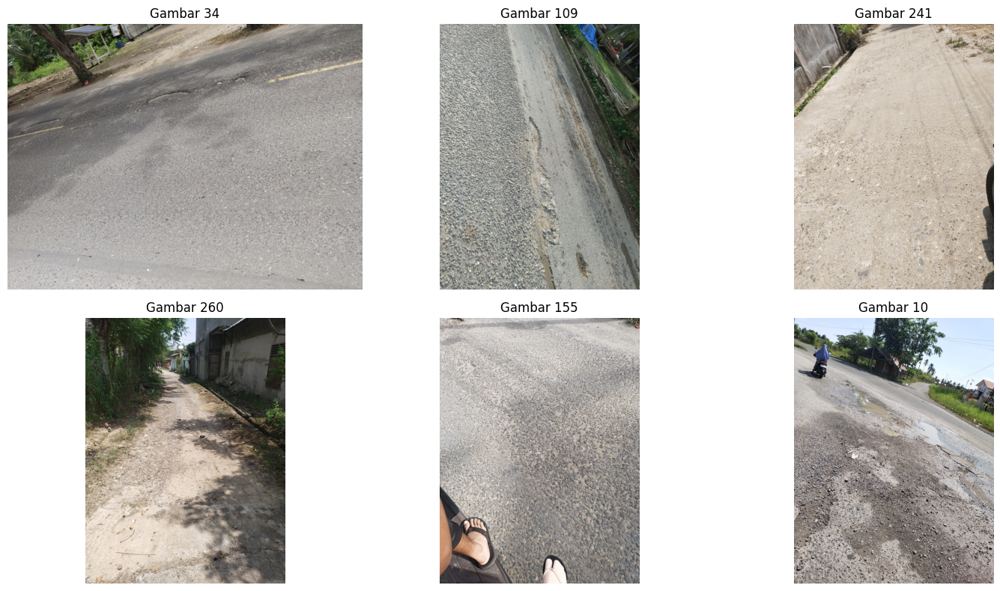

In [4]:
# ============================================================
# CELL 2 - MOUNT GOOGLE DRIVE & LOAD DATA (EXCEL + CITRA)
# ============================================================

# --- Mount Google Drive ---
drive.mount('/content/drive', force_remount=True)

# --- Konfigurasi path (SESUAIKAN dengan lokasi file Anda di Drive) ---
EXCEL_PATH = '/content/drive/MyDrive/JOKIAN/Imay/DATA JALAN REVISI.xlsx'
IMAGE_DIR  = '/content/drive/MyDrive/JOKIAN/Imay/jalan'

# --- Load data Excel ---
df = pd.read_excel(EXCEL_PATH, sheet_name='Data Kerusakan Jalan')
print(f'Jumlah baris data Excel : {len(df)}')
print(f'Kolom                   : {list(df.columns)}')
df.head()

# --- Cek isi folder citra ---
image_dir_path = Path(IMAGE_DIR)
if not image_dir_path.exists():
    raise FileNotFoundError(
        f'Folder citra tidak ditemukan: {IMAGE_DIR}\n'
        'Periksa kembali path folder di Google Drive Anda.'
    )

all_files_in_dir = list(image_dir_path.glob('*'))
print(f'Jumlah file di dalam folder citra: {len(all_files_in_dir)}')

# --- Bangun index nama file (huruf kecil, tanpa ekstensi) -> path asli ---
# Ini menyelesaikan masalah "Gambar 1" (Excel) vs "gambar 1.jpg" (nama file).
index_file = {}
for file_path in all_files_in_dir:
    if file_path.is_file():
        nama_tanpa_ekstensi = file_path.stem.strip().lower()
        index_file[nama_tanpa_ekstensi] = str(file_path)

def cari_file_citra(nama_citra, index_file):
    """
    Mencari file citra berdasarkan nama dari kolom Citra,
    tidak peduli perbedaan huruf besar/kecil maupun spasi berlebih.
    Mengembalikan path lengkap jika ketemu, None jika tidak ketemu.
    """
    key = str(nama_citra).strip().lower()
    return index_file.get(key)

df['image_path'] = df['Citra'].apply(lambda nama: cari_file_citra(nama, index_file))

# --- Laporan hasil pencocokan ---
jumlah_ditemukan = df['image_path'].notna().sum()
jumlah_hilang = df['image_path'].isna().sum()

print(f'\nCitra ditemukan : {jumlah_ditemukan} dari {len(df)}')
print(f'Citra hilang    : {jumlah_hilang}')

if jumlah_hilang > 0:
    print('\nDaftar citra yang belum ditemukan filenya:')
    print(df.loc[df['image_path'].isna(), 'Citra'].tolist())

# --- Tampilkan beberapa sampel citra untuk verifikasi visual ---
sampel = df[df['image_path'].notna()].sample(min(6, jumlah_ditemukan), random_state=SEED)

plt.figure(figsize=(15, 8))
for i, (_, baris) in enumerate(sampel.iterrows()):
    img = cv2.imread(baris['image_path'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.title(f"{baris['Citra']}")
    plt.axis('off')
plt.tight_layout()
plt.show()

In [5]:
# ============================================================
# CELL 3a (LABELING OTOMATIS) - Ekstraksi fitur + Klasterisasi K-Means
# ============================================================
# Menggantikan proxy P x L dari Excel maupun deteksi piksel manual.
# Kedua pendekatan itu terbukti tidak akurat: proxy P x L hanya
# menghasilkan kecocokan sekitar 47-50% dengan pola visual foto, dan
# deteksi piksel manual rata-rata hanya menangkap 0.0015% luas foto
# (jauh dari realistis untuk retak atau lubang jalan).
#
# Metode di sini: setiap foto diubah jadi vektor fitur numerik lewat
# MobileNetV2 (model yang sama dipakai untuk training nanti), lalu
# dikelompokkan otomatis jadi 4 klaster dengan K-Means. Klaster diurutkan
# jadi kelas SDI berdasarkan rata-rata kepadatan tepi (edge density) tiap
# klaster, karena foto jalan rusak biasanya punya tepi/retak jauh lebih
# banyak dibanding jalan mulus. Tidak ada label manual atau P/L Excel
# yang dipakai sama sekali di sini.

from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mnv2_preprocess
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

df_ada_gambar = df[df['image_path'].notna()].reset_index(drop=True)

# --- Model ekstraksi fitur (tanpa lapisan klasifikasi, hasil akhir dirata-rata) ---
ekstraktor_fitur = MobileNetV2(input_shape=(224, 224, 3), include_top=False,
                                pooling='avg', weights='imagenet')

def muat_citra(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224), interpolation=cv2.INTER_LANCZOS4)
    return img

def hitung_kepadatan_tepi(img_rgb):
    """Proporsi piksel yang terdeteksi sebagai tepi (proxy keparahan retak)."""
    abu = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    tepi = cv2.Canny(abu, 50, 150)
    return float(tepi.mean() / 255.0)

fitur_embedding = []
fitur_tepi = []

for path in tqdm(df_ada_gambar['image_path'], desc='Ekstraksi fitur'):
    img = muat_citra(path)
    fitur_tepi.append(hitung_kepadatan_tepi(img))

    img_batch = np.expand_dims(img.astype(np.float32), axis=0)
    img_batch = mnv2_preprocess(img_batch)
    embed = ekstraktor_fitur.predict(img_batch, verbose=0)[0]
    fitur_embedding.append(embed)

fitur_embedding = np.array(fitur_embedding)
fitur_tepi = np.array(fitur_tepi)
df_ada_gambar['kepadatan_tepi'] = fitur_tepi

print(f'Bentuk embedding per foto : {fitur_embedding.shape}')

# --- Standarisasi + reduksi dimensi sebelum klasterisasi ---
scaler = StandardScaler()
fitur_scaled = scaler.fit_transform(fitur_embedding)

pca = PCA(n_components=50, random_state=SEED)
fitur_pca = pca.fit_transform(fitur_scaled)
print(f'Variansi yang dijelaskan 50 komponen PCA : {pca.explained_variance_ratio_.sum():.2%}')

# --- K-Means, 4 klaster sesuai jumlah kelas SDI ---
kmeans = KMeans(n_clusters=4, random_state=SEED, n_init=10)
df_ada_gambar['klaster'] = kmeans.fit_predict(fitur_pca)

# --- Urutkan klaster jadi kelas berdasarkan rata-rata kepadatan tepi ---
URUTAN_KELAS = ['Baik', 'Sedang', 'Rusak Ringan', 'Rusak Berat']
rata_tepi_per_klaster = df_ada_gambar.groupby('klaster')['kepadatan_tepi'].mean().sort_values()
urutan_klaster = rata_tepi_per_klaster.index.tolist()
PETA_KLASTER_KE_KELAS = {klaster_id: nama for klaster_id, nama in zip(urutan_klaster, URUTAN_KELAS)}

df_ada_gambar['Kelas'] = df_ada_gambar['klaster'].map(PETA_KLASTER_KE_KELAS)

print('\nRata-rata kepadatan tepi per klaster (urutan rendah ke tinggi):')
print(rata_tepi_per_klaster)
print('\nPemetaan klaster ke kelas:')
for k, v in PETA_KLASTER_KE_KELAS.items():
    print(f'  Klaster {k} -> {v}')

print('\nDistribusi kelas hasil klasterisasi:')
print(df_ada_gambar['Kelas'].value_counts())

# --- Gabungkan kelas ke df utama ---
df = df.drop(columns=['Kelas'], errors='ignore')
df = df.merge(df_ada_gambar[['Citra', 'Kelas']], on='Citra', how='left')

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Ekstraksi fitur:   0%|          | 0/280 [00:00<?, ?it/s]

Bentuk embedding per foto : (280, 1280)
Variansi yang dijelaskan 50 komponen PCA : 68.78%

Rata-rata kepadatan tepi per klaster (urutan rendah ke tinggi):
klaster
2    0.287977
0    0.297991
1    0.323458
3    0.323830
Name: kepadatan_tepi, dtype: float64

Pemetaan klaster ke kelas:
  Klaster 2 -> Baik
  Klaster 0 -> Sedang
  Klaster 1 -> Rusak Ringan
  Klaster 3 -> Rusak Berat

Distribusi kelas hasil klasterisasi:
Kelas
Rusak Ringan    105
Rusak Berat      64
Baik             62
Sedang           49
Name: count, dtype: int64


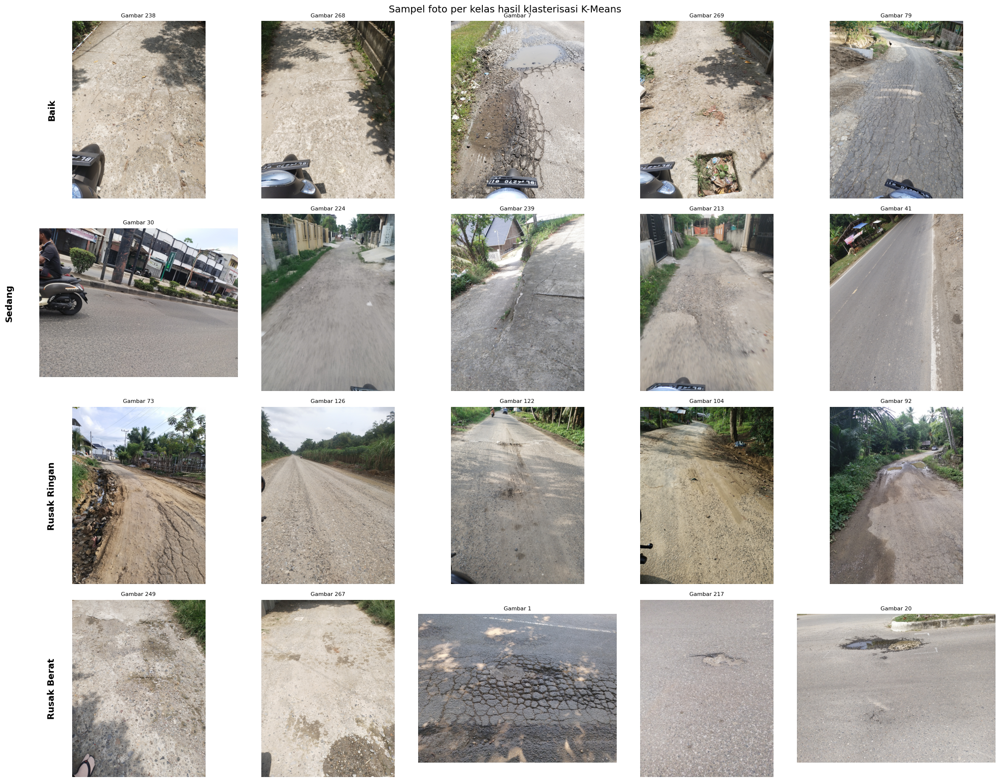


Periksa gambar di atas:
- Baris "Baik" seharusnya berisi jalan mulus atau nyaris tanpa retak.
- Baris "Rusak Berat" seharusnya berisi jalan paling parah (lubang besar,
  retak lebar dan menyambung).

Jika urutannya terbalik atau kelasnya bercampur (foto mulus dan foto
rusak parah muncul di kelas yang sama), kemungkinan penyebabnya:
1. Kepadatan tepi ikut menangkap objek lain (bayangan pohon, marka jalan,
   tekstur aspal kasar tapi tidak rusak). Coba ganti metrik pengurut
   klaster, misalnya kombinasikan dengan variansi tekstur (GLCM) atau
   rata-rata kegelapan piksel.
2. 4 klaster tidak cocok dengan variasi asli foto. Coba jalankan ulang
   Cell 3a dengan n_clusters lain (misalnya 5 atau 6), lalu gabungkan
   klaster yang miripsecara manual sebelum dipetakan ke 4 kelas SDI.



In [6]:
# ============================================================
# CELL 3b (LABELING OTOMATIS) - Validasi visual hasil klasterisasi
# ============================================================
# Klasterisasi tetap perlu dicek, bukan langsung dipercaya mentah-mentah.
# Cell ini menampilkan 5 foto sampel dari tiap kelas supaya Anda bisa
# menilai sekilas apakah urutan Baik -> Rusak Berat sudah masuk akal.
# Ini BUKAN pelabelan manual satu per satu, hanya spot-check cepat.

JUMLAH_SAMPEL_PER_KELAS = 5

fig, axes = plt.subplots(len(URUTAN_KELAS), JUMLAH_SAMPEL_PER_KELAS,
                          figsize=(4 * JUMLAH_SAMPEL_PER_KELAS, 4 * len(URUTAN_KELAS)))

for baris_idx, kelas in enumerate(URUTAN_KELAS):
    subset = df_ada_gambar[df_ada_gambar['Kelas'] == kelas]
    sampel = subset.sample(min(JUMLAH_SAMPEL_PER_KELAS, len(subset)), random_state=SEED)

    for kolom_idx in range(JUMLAH_SAMPEL_PER_KELAS):
        ax = axes[baris_idx, kolom_idx]
        if kolom_idx < len(sampel):
            baris = sampel.iloc[kolom_idx]
            img = cv2.imread(baris['image_path'])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img)
            ax.set_title(baris['Citra'], fontsize=8)
        ax.axis('off')

    axes[baris_idx, 0].text(-0.15, 0.5, kelas, fontsize=13, fontweight='bold',
                             rotation=90, va='center', ha='center',
                             transform=axes[baris_idx, 0].transAxes)

plt.suptitle('Sampel foto per kelas hasil klasterisasi K-Means', fontsize=14)
plt.tight_layout()
plt.show()

print("""
Periksa gambar di atas:
- Baris "Baik" seharusnya berisi jalan mulus atau nyaris tanpa retak.
- Baris "Rusak Berat" seharusnya berisi jalan paling parah (lubang besar,
  retak lebar dan menyambung).

Jika urutannya terbalik atau kelasnya bercampur (foto mulus dan foto
rusak parah muncul di kelas yang sama), kemungkinan penyebabnya:
1. Kepadatan tepi ikut menangkap objek lain (bayangan pohon, marka jalan,
   tekstur aspal kasar tapi tidak rusak). Coba ganti metrik pengurut
   klaster, misalnya kombinasikan dengan variansi tekstur (GLCM) atau
   rata-rata kegelapan piksel.
2. 4 klaster tidak cocok dengan variasi asli foto. Coba jalankan ulang
   Cell 3a dengan n_clusters lain (misalnya 5 atau 6), lalu gabungkan
   klaster yang miripsecara manual sebelum dipetakan ke 4 kelas SDI.
""")

Memproses 280 citra...


Preprocessing:   0%|          | 0/280 [00:00<?, ?it/s]

Bentuk array hasil preprocessing : (280, 224, 224, 3)
Jumlah label ikut tersinkron     : 280

Distribusi kelas pada data yang siap dipreprocessing:
Kelas
Rusak Ringan    105
Rusak Berat      64
Baik             62
Sedang           49
Name: count, dtype: int64


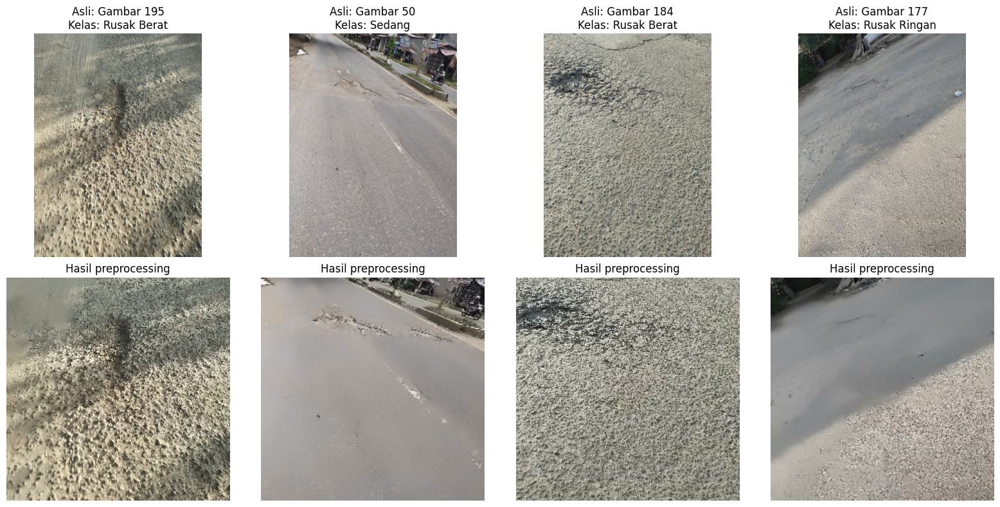

In [7]:
# ============================================================
# CELL 4 - PREPROCESSING CITRA
# ============================================================

RESIZE_SIZE = 256   # Ukuran resize awal
CROP_SIZE   = 224   # Ukuran input model (MobileNetV2)

# --- Tahap 1: Resize ke 256x256 dengan interpolasi LANCZOS ---
def resize_gambar(img, target_size=RESIZE_SIZE):
    return cv2.resize(img, (target_size, target_size), interpolation=cv2.INTER_LANCZOS4)

# --- Tahap 2: Center crop ke 224x224 ---
def center_crop(img, crop_size=CROP_SIZE):
    h, w = img.shape[:2]
    start_y = (h - crop_size) // 2
    start_x = (w - crop_size) // 2
    return img[start_y:start_y + crop_size, start_x:start_x + crop_size]

# --- Tahap 3: Denoise dengan OpenCV ---
def denoise_gambar(img):
    return cv2.fastNlMeansDenoisingColored(img, None, h=7, hColor=7,
                                            templateWindowSize=7, searchWindowSize=21)

# --- Fungsi utama: gabungan seluruh tahap preprocessing ---
# Catatan: normalisasi ke [-1,1] TIDAK dilakukan di sini. Itu ditangani
# preprocess_input MobileNetV2 secara otomatis saat training (cell model).
# Augmentasi juga TIDAK dilakukan di sini, itu tanggung jawab Cell 6,
# dan hanya diterapkan ke subset data training saat proses training berjalan.
def preprocess_citra(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img = resize_gambar(img)   # Tahap 1: Resize 256x256
    img = center_crop(img)     # Tahap 2: Center crop 224x224
    img = denoise_gambar(img)  # Tahap 3: Denoise

    return img

# --- Terapkan preprocessing ke seluruh citra yang berhasil ditemukan dan dilabel ---
df_valid = df[df['image_path'].notna() & df['Kelas'].notna()].reset_index(drop=True)

print(f'Memproses {len(df_valid)} citra...')

X_preprocessed = []
for path in tqdm(df_valid['image_path'], desc='Preprocessing'):
    hasil = preprocess_citra(path)
    X_preprocessed.append(hasil)

X_preprocessed = np.array(X_preprocessed)
print(f'Bentuk array hasil preprocessing : {X_preprocessed.shape}')
print(f'Jumlah label ikut tersinkron     : {len(df_valid)}')

# --- Sinkronkan label kelas hasil Cell 3 dengan urutan X_preprocessed ---
y_labels = df_valid['Kelas'].values
print('\nDistribusi kelas pada data yang siap dipreprocessing:')
print(df_valid['Kelas'].value_counts())

# --- Visualisasi: citra asli vs hasil preprocessing, lengkap dengan label ---
indeks_sampel = random.sample(range(len(df_valid)), min(4, len(df_valid)))

fig, axes = plt.subplots(2, len(indeks_sampel), figsize=(4 * len(indeks_sampel), 8))
for i, idx in enumerate(indeks_sampel):
    img_asli = cv2.imread(df_valid.loc[idx, 'image_path'])
    img_asli = cv2.cvtColor(img_asli, cv2.COLOR_BGR2RGB)

    axes[0, i].imshow(img_asli)
    axes[0, i].set_title(f"Asli: {df_valid.loc[idx, 'Citra']}\nKelas: {df_valid.loc[idx, 'Kelas']}")
    axes[0, i].axis('off')

    axes[1, i].imshow(X_preprocessed[idx])
    axes[1, i].set_title('Hasil preprocessing')
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

Pemetaan kelas ke angka:
  0 -> Baik
  1 -> Sedang
  2 -> Rusak Ringan
  3 -> Rusak Berat

Total data          : 280
Data training       : 224
Data validasi       : 56

Distribusi kelas per subset:
              Training  Validasi
Baik                50        12
Sedang              39        10
Rusak Ringan        84        21
Rusak Berat         51        13


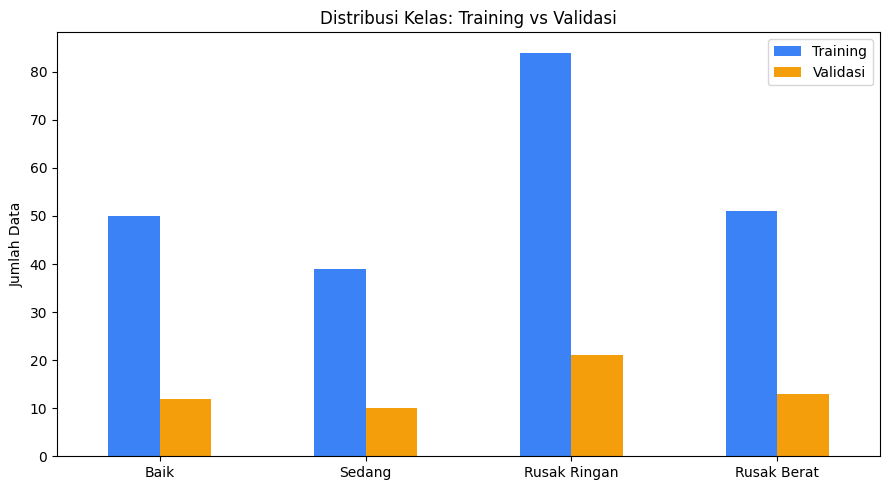


Class weight (dipakai saat training untuk atasi ketidakseimbangan kelas):
  Baik           : 1.1200
  Sedang         : 1.4359
  Rusak Ringan   : 0.6667
  Rusak Berat    : 1.0980


In [8]:
# ============================================================
# CELL 5 - SPLIT DATA (STRATIFIED K-FOLD)
# ============================================================

# --- Urutan kelas (mengikuti tingkat keparahan sesuai SDI Bina Marga) ---
URUTAN_KELAS = ['Baik', 'Sedang', 'Rusak Ringan', 'Rusak Berat']
KELAS_KE_INDEKS = {nama: i for i, nama in enumerate(URUTAN_KELAS)}
INDEKS_KE_KELAS = {i: nama for nama, i in KELAS_KE_INDEKS.items()}

# --- Encode label teks menjadi angka ---
y_encoded = np.array([KELAS_KE_INDEKS[label] for label in y_labels])

print('Pemetaan kelas ke angka:')
for nama, idx in KELAS_KE_INDEKS.items():
    print(f'  {idx} -> {nama}')

# --- Stratified K-Fold, K=5 ---
N_SPLITS = 5
FOLD_VALIDASI = 3  # fold ke-3 dari 5 dipakai sebagai validasi (1-indexed)

skf = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=SEED)

daftar_fold = list(skf.split(X_preprocessed, y_encoded))
idx_train, idx_val = daftar_fold[FOLD_VALIDASI - 1]

# --- Bagi data berdasarkan indeks fold terpilih ---
X_train, X_val = X_preprocessed[idx_train], X_preprocessed[idx_val]
y_train, y_val = y_encoded[idx_train], y_encoded[idx_val]

print(f'\nTotal data          : {len(X_preprocessed)}')
print(f'Data training       : {len(X_train)}')
print(f'Data validasi       : {len(X_val)}')

# --- Distribusi kelas di masing-masing subset ---
def hitung_distribusi(y, urutan_kelas, indeks_ke_kelas):
    hitung = pd.Series(y).value_counts().reindex(range(len(urutan_kelas)), fill_value=0)
    hitung.index = [indeks_ke_kelas[i] for i in hitung.index]
    return hitung

distribusi_train = hitung_distribusi(y_train, URUTAN_KELAS, INDEKS_KE_KELAS)
distribusi_val = hitung_distribusi(y_val, URUTAN_KELAS, INDEKS_KE_KELAS)

tabel_distribusi = pd.DataFrame({
    'Training': distribusi_train,
    'Validasi': distribusi_val
}).reindex(URUTAN_KELAS)

print('\nDistribusi kelas per subset:')
print(tabel_distribusi)

# --- Visualisasi distribusi training vs validasi ---
tabel_distribusi.plot(kind='bar', figsize=(9, 5), color=['#3B82F6', '#F59E0B'])
plt.title('Distribusi Kelas: Training vs Validasi')
plt.ylabel('Jumlah Data')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# --- Hitung class weight dari data training (untuk atasi ketidakseimbangan kelas) ---
bobot_kelas_array = compute_class_weight(
    class_weight='balanced',
    classes=np.arange(len(URUTAN_KELAS)),
    y=y_train
)
class_weight_dict = {i: bobot for i, bobot in enumerate(bobot_kelas_array)}

print('\nClass weight (dipakai saat training untuk atasi ketidakseimbangan kelas):')
for idx, bobot in class_weight_dict.items():
    print(f'  {INDEKS_KE_KELAS[idx]:<15}: {bobot:.4f}')

In [9]:
# ============================================================
# CELL 6 - AUGMENTASI
# ============================================================

BATCH_SIZE = 32
AUTOTUNE = tf.data.AUTOTUNE

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(factor=20/360),
    layers.RandomBrightness(factor=0.25, value_range=(0, 255)),
    layers.RandomContrast(factor=0.25),
    layers.RandomZoom(height_factor=0.15, width_factor=0.15),
    layers.RandomTranslation(height_factor=0.1, width_factor=0.1),
], name='augmentasi_training')

def augmentasi_fn(gambar, label):
    gambar = data_augmentation(gambar, training=True)
    return gambar, label

train_dataset = tf.data.Dataset.from_tensor_slices((X_train.astype(np.float32), y_train))
train_dataset = train_dataset.shuffle(buffer_size=len(X_train), seed=SEED)
train_dataset = train_dataset.map(augmentasi_fn, num_parallel_calls=AUTOTUNE)
train_dataset = train_dataset.batch(BATCH_SIZE)
train_dataset = train_dataset.prefetch(AUTOTUNE)

val_dataset = tf.data.Dataset.from_tensor_slices((X_val.astype(np.float32), y_val))
val_dataset = val_dataset.batch(BATCH_SIZE)
val_dataset = val_dataset.prefetch(AUTOTUNE)

In [10]:
# ============================================================
# CELL 7 - TRAINING (2 FASE)
# ============================================================

JUMLAH_KELAS = len(URUTAN_KELAS)
PATIENCE = 15

def bangun_model(jumlah_kelas):
    input_layer = layers.Input(shape=(224, 224, 3), name='input_citra')
    x = layers.Lambda(preprocess_input, name='normalisasi_preprocess_input')(input_layer)

    base_model = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
    base_model.trainable = False

    x = base_model(x, training=False)
    x = layers.GlobalAveragePooling2D(name='gap')(x)
    x = layers.Dropout(0.5, name='dropout_1')(x)
    x = layers.Dense(64, activation='relu',
                      kernel_regularizer=tf.keras.regularizers.l2(0.01),
                      name='dense_64')(x)
    x = layers.Dropout(0.3, name='dropout_2')(x)
    output_layer = layers.Dense(jumlah_kelas, activation='softmax', name='output_klasifikasi')(x)

    model = models.Model(inputs=input_layer, outputs=output_layer, name='MobileNetV2_KerusakanJalan')
    return model, base_model

model, base_model = bangun_model(JUMLAH_KELAS)
model.summary()

# ============================================================
# FASE 1
# ============================================================
model.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

callbacks_fase1 = [
    tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=PATIENCE, restore_best_weights=True),
    tf.keras.callbacks.ModelCheckpoint('model_fase1_terbaik.keras', monitor='val_accuracy', mode='max', save_best_only=True)
]

print('=== FASE 1: Training dengan base model dibekukan ===')
history_fase1 = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=80,
    class_weight=class_weight_dict,
    callbacks=callbacks_fase1
)

# ============================================================
# FASE 2 - FINE-TUNING
# ============================================================
JUMLAH_LAYER_DIBUKA = 6

base_model.trainable = True
for layer in base_model.layers[:-JUMLAH_LAYER_DIBUKA]:
    layer.trainable = False

model.compile(
    optimizer=optimizers.Adam(learning_rate=0.00005),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

callbacks_fase2 = [
    tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=PATIENCE, restore_best_weights=True),
    tf.keras.callbacks.ModelCheckpoint('model_fase2_terbaik.keras', monitor='val_accuracy', mode='max', save_best_only=True)
]

print('\n=== FASE 2: Fine-tuning, 6 layer teratas dibuka ===')
history_fase2 = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=40,
    class_weight=class_weight_dict,
    callbacks=callbacks_fase2
)

print(f"Akurasi validasi terbaik Fase 1 : {max(history_fase1.history['val_accuracy']):.4f}")
print(f"Akurasi validasi terbaik Fase 2 : {max(history_fase2.history['val_accuracy']):.4f}")

Model: "MobileNetV2_KerusakanJalan"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_citra (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ normalisasi_preprocess_input    │ (None, 224, 224, 3)    │             0 │
│ (Lambda)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 64)             │        81,984 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_klasifikasi (Dense)      │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,340,228 (8.93 MB)

 Trainable params: 82,244 (321.27 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

=== FASE 1: Training dengan base model dibekukan ===
Epoch 1/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 41s 3s/step - accuracy: 0.2946 - loss: 3.0744 - val_accuracy: 0.5536 - val_loss: 2.1925
Epoch 2/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 177ms/step - accuracy: 0.4152 - loss: 2.5324 - val_accuracy: 0.7321 - val_loss: 2.0232
Epoch 3/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step - accuracy: 0.5089 - loss: 2.2918 - val_accuracy: 0.7857 - val_loss: 1.8617
Epoch 4/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 178ms/step - accuracy: 0.5714 - loss: 2.1677 - val_accuracy: 0.8571 - val_loss: 1.7822
Epoch 5/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.6071 - loss: 2.0445 - val_accuracy: 0.8571 - val_loss: 1.7020
Epoch 6/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - accuracy: 0.5938 - loss: 1.9851 - val_accuracy: 0.8571 - val_loss: 1.6128
Epoch 7/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.6607 - loss: 1.8009 - val_accuracy: 0.8571 - val_loss: 1.5346
Epoch 8/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - accuracy: 0.6205 - 

2/2 ━━━━━━━━━━━━━━━━━━━━ 11s 5s/step
Akurasi pada data validasi: 0.9286 (52/56)


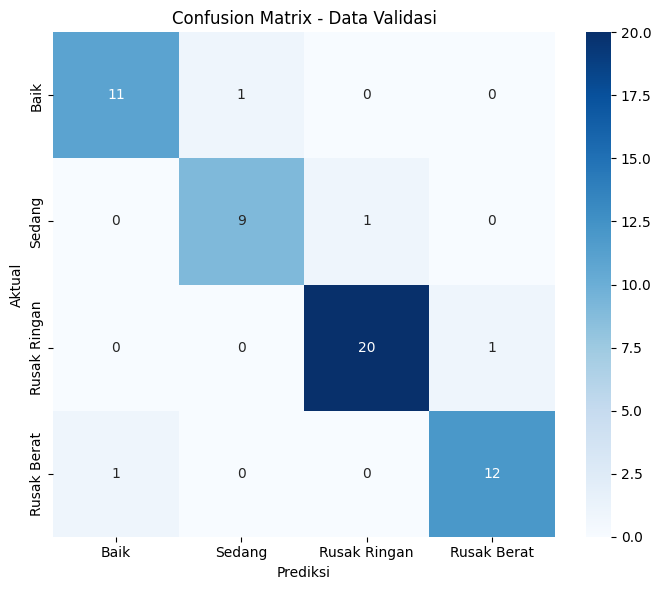


Laporan evaluasi per kelas (dalam persen):
              precision  recall  f1-score    support
Baik              91.67   91.67     91.67  12.000000
Sedang            90.00   90.00     90.00  10.000000
Rusak Ringan      95.24   95.24     95.24  21.000000
Rusak Berat       92.31   92.31     92.31  13.000000
accuracy          92.86   92.86     92.86   0.928571
macro avg         92.30   92.30     92.30  56.000000
weighted avg      92.86   92.86     92.86  56.000000


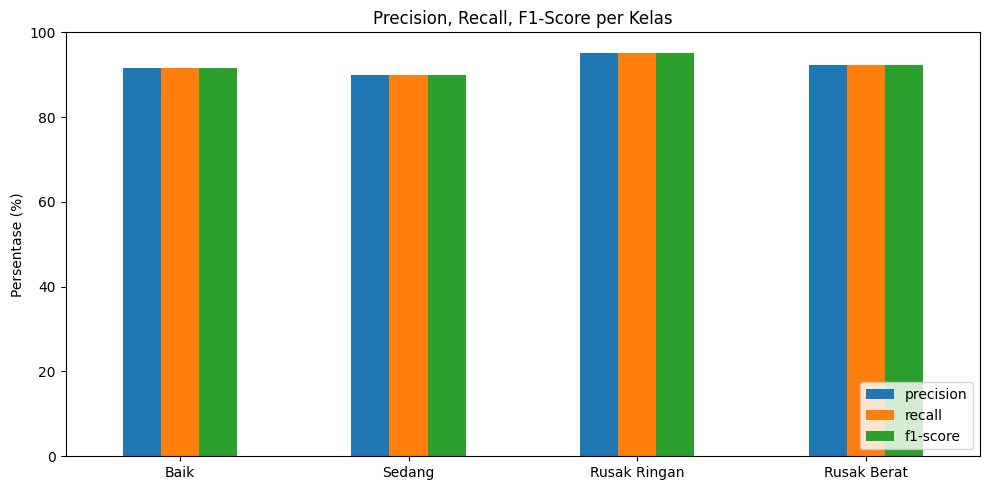


Jumlah prediksi salah: 4 dari 56


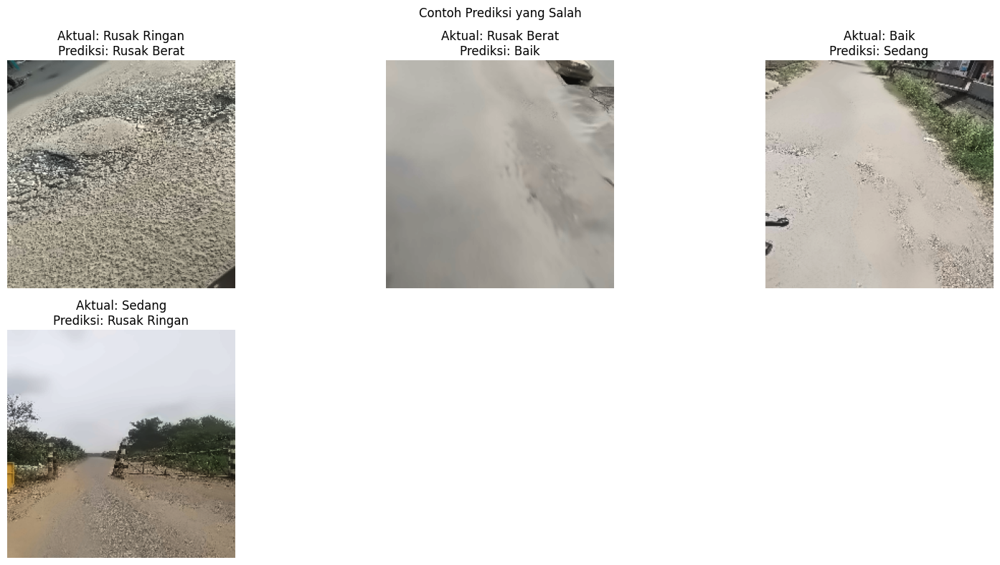

In [11]:
# ============================================================
# CELL 8 - EVALUASI MODEL
# ============================================================

# Catatan: tidak perlu load ulang model dari file .keras. Karena kedua fase
# training memakai EarlyStopping(restore_best_weights=True), variabel
# `model` di memori sudah otomatis berisi bobot terbaik dari Fase 2.

# --- Prediksi pada data validasi ---
# val_dataset tidak di-shuffle, jadi urutan prediksi tetap sinkron dengan y_val.
y_pred_proba = model.predict(val_dataset)
y_pred = np.argmax(y_pred_proba, axis=1)
y_true = y_val

# --- Akurasi keseluruhan ---
akurasi = accuracy_score(y_true, y_pred)
print(f'Akurasi pada data validasi: {akurasi:.4f} ({int(round(akurasi * len(y_true)))}/{len(y_true)})')

# --- Confusion matrix ---
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(7, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=URUTAN_KELAS, yticklabels=URUTAN_KELAS)
plt.xlabel('Prediksi')
plt.ylabel('Aktual')
plt.title('Confusion Matrix - Data Validasi')
plt.tight_layout()
plt.show()

# --- Precision, recall, F1-score per kelas ---
laporan_dict = classification_report(y_true, y_pred, target_names=URUTAN_KELAS, output_dict=True)
df_laporan = pd.DataFrame(laporan_dict).transpose()

for kolom in ['precision', 'recall', 'f1-score']:
    df_laporan[kolom] = (df_laporan[kolom] * 100).round(2)

print('\nLaporan evaluasi per kelas (dalam persen):')
print(df_laporan)

# --- Visualisasi precision, recall, F1-score per kelas ---
metrik_per_kelas = df_laporan.loc[URUTAN_KELAS, ['precision', 'recall', 'f1-score']]

metrik_per_kelas.plot(kind='bar', figsize=(10, 5))
plt.title('Precision, Recall, F1-Score per Kelas')
plt.ylabel('Persentase (%)')
plt.xticks(rotation=0)
plt.ylim(0, 100)
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()

# --- Tampilkan beberapa contoh prediksi yang salah, untuk pemeriksaan kualitatif ---
indeks_salah = np.where(y_pred != y_true)[0]
print(f'\nJumlah prediksi salah: {len(indeks_salah)} dari {len(y_true)}')

if len(indeks_salah) > 0:
    jumlah_tampil = min(6, len(indeks_salah))
    indeks_tampil = random.sample(list(indeks_salah), jumlah_tampil)

    plt.figure(figsize=(16, 8))
    for i, idx in enumerate(indeks_tampil):
        plt.subplot(2, 3, i + 1)
        plt.imshow(X_val[idx].astype(np.uint8))
        plt.title(f"Aktual: {INDEKS_KE_KELAS[y_true[idx]]}\nPrediksi: {INDEKS_KE_KELAS[y_pred[idx]]}")
        plt.axis('off')
    plt.suptitle('Contoh Prediksi yang Salah')
    plt.tight_layout()
    plt.show()
else:
    print('Semua data validasi diprediksi dengan benar.')

In [12]:
# ============================================================
# CELL 9 - KLASIFIKASI (PREDIKSI SELURUH DATA + EKSPOR GEOJSON)
# ============================================================

!pip install -q folium
import folium
import json

WARNA_KELAS = {
    'Baik': '#10B981',
    'Sedang': '#F59E0B',
    'Rusak Ringan': '#F97316',
    'Rusak Berat': '#E53E3E'
}

# --- Prediksi ke SELURUH data (bukan hanya data validasi) ---
X_semua = X_preprocessed.astype(np.float32)
proba_semua = model.predict(X_semua, batch_size=BATCH_SIZE)
prediksi_indeks = np.argmax(proba_semua, axis=1)
prediksi_kelas = [INDEKS_KE_KELAS[i] for i in prediksi_indeks]
prediksi_keyakinan = np.max(proba_semua, axis=1)

df_hasil = df_valid.copy()
df_hasil['Kelas_Prediksi'] = prediksi_kelas
df_hasil['Keyakinan'] = prediksi_keyakinan
df_hasil['Cocok'] = df_hasil['Kelas'] == df_hasil['Kelas_Prediksi']

akurasi_seluruh_data = df_hasil['Cocok'].mean()
print(f'Kecocokan prediksi model dengan label manual (seluruh data): {akurasi_seluruh_data:.4f}')
print('\nDistribusi hasil klasifikasi model:')
print(df_hasil['Kelas_Prediksi'].value_counts())

# --- Bangun GeoJSON FeatureCollection ---
# Catatan: kolom Luas_Kerusakan, SDI, P, dan L dihapus dari properti.
# Label sekarang murni dari penilaian visual manual terhadap citra,
# jadi P dan L dari Excel tidak lagi relevan untuk hasil klasifikasi.
features = []
for _, baris in df_hasil.iterrows():
    feature = {
        'type': 'Feature',
        'geometry': {
            'type': 'Point',
            'coordinates': [baris['y'], baris['x']]  # GeoJSON: [longitude, latitude]
        },
        'properties': {
            'citra': baris['Citra'],
            'kelas': baris['Kelas_Prediksi'],
            'keyakinan': round(float(baris['Keyakinan']), 4),
            'warna': WARNA_KELAS[baris['Kelas_Prediksi']]
        }
    }
    features.append(feature)

geojson_hasil = {
    'type': 'FeatureCollection',
    'features': features
}

# --- Simpan ke file ---
PATH_OUTPUT_GEOJSON = 'hasil_klasifikasi_jalan.geojson'
with open(PATH_OUTPUT_GEOJSON, 'w', encoding='utf-8') as f:
    json.dump(geojson_hasil, f, ensure_ascii=False, indent=2)
print(f'\nGeoJSON tersimpan: {PATH_OUTPUT_GEOJSON} ({len(features)} titik)')

# --- Simpan juga sebagai tabel arsip (CSV) ---
PATH_OUTPUT_CSV = 'hasil_klasifikasi_jalan.csv'
kolom_arsip = ['Citra', 'x', 'y', 'Kelas', 'Kelas_Prediksi', 'Keyakinan', 'Cocok']
df_hasil[kolom_arsip].to_csv(PATH_OUTPUT_CSV, index=False)
print(f'Tabel hasil tersimpan: {PATH_OUTPUT_CSV}')

# --- Unduh kedua file ke komputer ---
files.download(PATH_OUTPUT_GEOJSON)
files.download(PATH_OUTPUT_CSV)

# --- Preview cepat di peta, untuk pengecekan visual sebelum dipakai di web ---
peta = folium.Map(location=[5.1801, 97.1499], zoom_start=13)

for _, baris in df_hasil.iterrows():
    folium.CircleMarker(
        location=[baris['x'], baris['y']],
        radius=5,
        color=WARNA_KELAS[baris['Kelas_Prediksi']],
        fill=True,
        fill_color=WARNA_KELAS[baris['Kelas_Prediksi']],
        fill_opacity=0.8,
        popup=f"{baris['Citra']} - {baris['Kelas_Prediksi']} ({baris['Keyakinan']:.2%})"
    ).add_to(peta)

peta

9/9 ━━━━━━━━━━━━━━━━━━━━ 11s 677ms/step
Kecocokan prediksi model dengan label manual (seluruh data): 0.8679

Distribusi hasil klasifikasi model:
Kelas_Prediksi
Rusak Ringan    108
Rusak Berat      69
Baik             60
Sedang           43
Name: count, dtype: int64

GeoJSON tersimpan: hasil_klasifikasi_jalan.geojson (280 titik)
Tabel hasil tersimpan: hasil_klasifikasi_jalan.csv


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>